# A method for classifying hydrological alteration

In [1]:
from hidrocomp.series import Flow
import math
import pandas as pd
import plotly as py
import plotly.graph_objects as go

In [2]:
flow_ana = Flow(data=pd.read_csv("ana.csv", index_col=0, parse_dates=True))
flow_sar = Flow(data=pd.read_csv("sar.csv", index_col=0, parse_dates=True))
flow_ons = Flow(data=pd.read_csv("ons.csv", index_col=0, parse_dates=True))

In [3]:
flow_ons.month_num_flood, flow_ons.month_abr_flood

(8, 'AS-AUG')

In [4]:
flow = flow_ana.data.combine_first(flow_sar.data).combine_first(flow_ons.data)
flow

,66160000,66231000,A19086,D19086,MANSO
1972-08-07,11.2110,NaN,NaN,NaN,NaN
1972-08-08,11.2110,NaN,NaN,NaN,NaN
1972-08-09,11.6272,NaN,NaN,NaN,NaN
1972-08-10,11.6272,NaN,NaN,NaN,NaN
1972-08-11,11.6272,NaN,NaN,NaN,NaN
...,...,...,...,...,...
2020-07-18,NaN,NaN,41.94,121.0,NaN
2020-07-19,NaN,NaN,34.02,121.0,NaN
2020-07-20,NaN,NaN,41.93,121.0,NaN
2020-07-21,NaN,NaN,34.02,121.0,NaN


In [5]:
flow = Flow(data=flow)

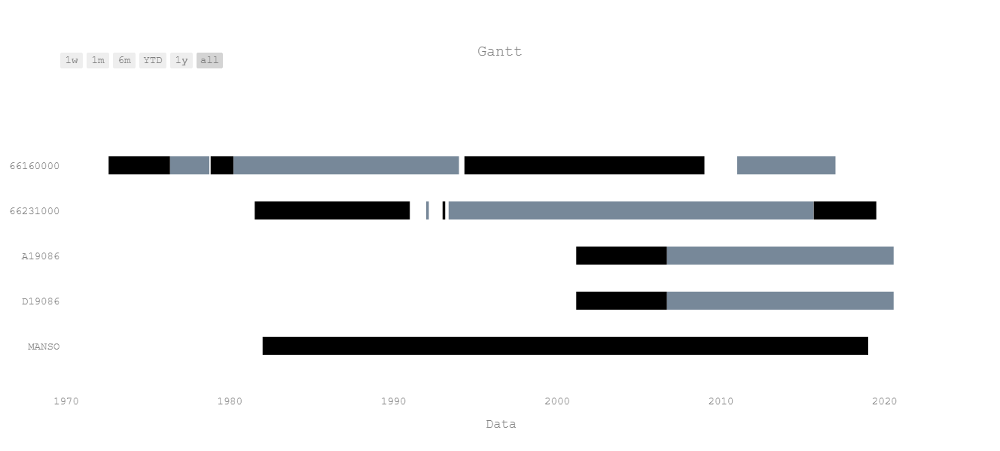

In [6]:
fig_gantt, data_gantt = flow.gantt("Gantt")
py.offline.iplot(fig_gantt)

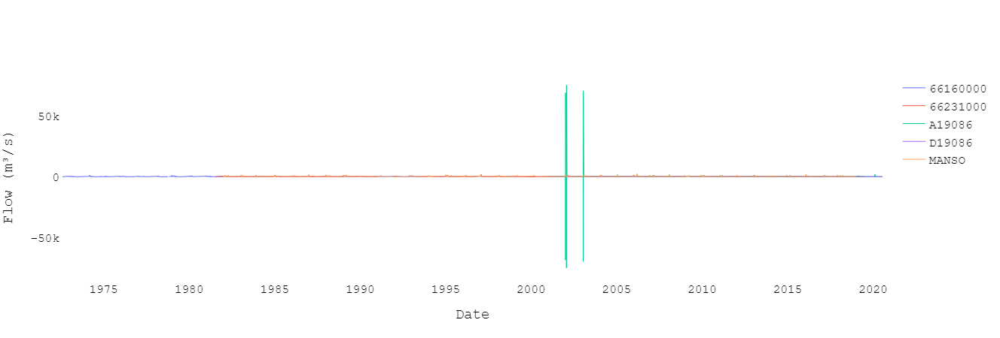

In [7]:
fig_hidro, data_hidro = flow.hydrogram("")
py.offline.iplot(fig_hidro)

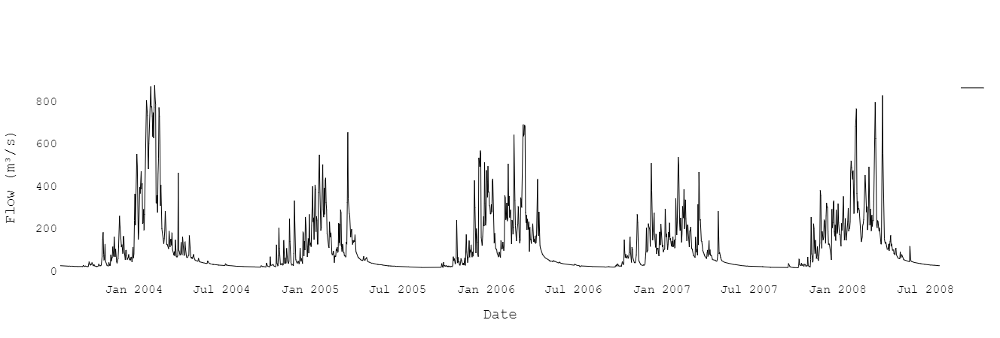

In [8]:
flow_quebo1 = Flow(data=flow_ana.data["66160000"].to_frame())
flow_quebo1.date(date_start="01/08/2003", date_end="31/07/2008")
fig_hydro_quebo1, data_hydro_quebo1 = flow_quebo1.hydrogram("")
py.offline.iplot(fig_hydro_quebo1)

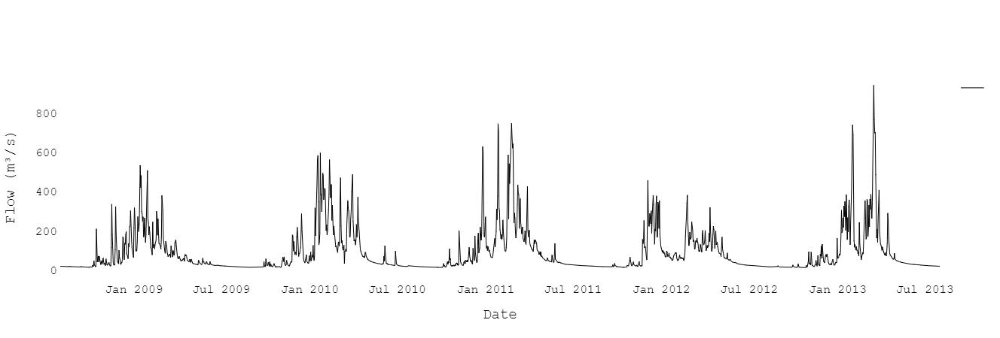

In [9]:
flow_quebo2 = Flow(data=flow_ana.data["66160000"].to_frame())
flow_quebo2.date(date_start="01/08/2011", date_end="31/07/2016")
date_range = pd.date_range(start=pd.to_datetime("01/08/2008", dayfirst=True), end=pd.to_datetime("01/08/2013", dayfirst=True))
flow_quebo2.data.index = date_range
fig_hydro_quebo2, data_hydro_quebo2 = flow_quebo2.hydrogram("")
py.offline.iplot(fig_hydro_quebo2)

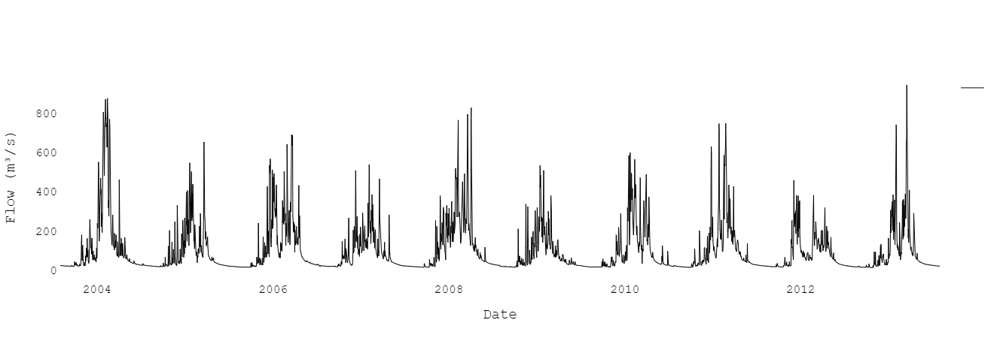

In [10]:
data_quebo = flow_quebo1.data.combine_first(flow_quebo2.data)
flow_quebo = Flow(data=data_quebo)
fig_hydro_quebo, data_hydro_quebo = flow_quebo.hydrogram("")
py.offline.iplot(fig_hydro_quebo)

In [39]:
flow_quebo.month_abr_flood

'AS-SEP'

In [11]:
area_sb = 4260
area_ss = 9580
f"66160000: {area_sb} km²  66231000: {area_ss} km²"

'66160000: 4260 km²  66231000: 9580 km²'

In [12]:
alpha = area_ss/area_sb
alpha

2.248826291079812

In [13]:
flow_quebo_ajuste = Flow(data=data_quebo*alpha)

## Interpolar dados

In [14]:
date_start = "01/08/2003"
date_end = "31/07/2013"

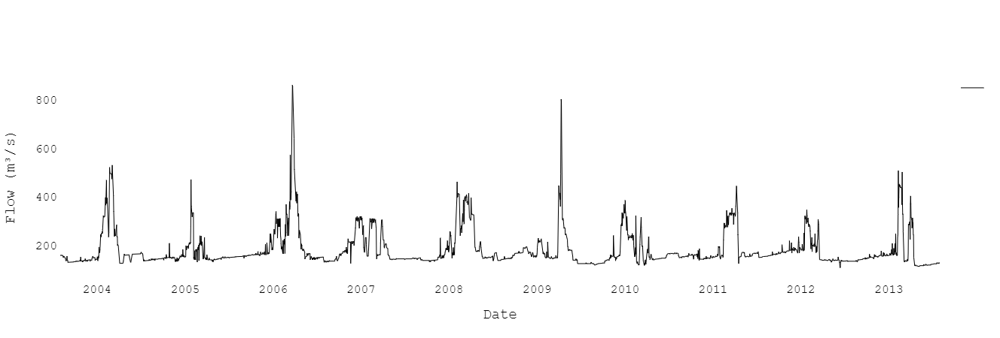

In [15]:
flow_raiz = Flow(flow.data["66231000"].to_frame()).date(date_start=date_start, date_end=date_end)
fig_hydro_raiz, data_hydro_raiz = flow_raiz.hydrogram("")
py.offline.iplot(fig_hydro_raiz)

Variables: 
- Magnitude:
    - 1-day maximum
    - 1-day minimum
- Duration:
    - High pulse duration
    - Low pulse duration
- Frequency:
    - High pulse count
    - Low pulse count
- Timing:
    - Date of maximum
    - Date of minimum

# Control x Impact

In [16]:
# data.station = "66160000"
# data.date(date_start="01/09/2001")
# data_max = data.maximum()
data_thres = flow.data["66160000"]*alpha
threshold_high = data_thres.quantile(0.75)
f"Threshold: {threshold_high}"

'Threshold: 291.61879812206575'

In [17]:
# data_min = data.minimum()
threshold_low = data_thres.quantile(0.50) # data_min.peaks.max().values[0]
f"Threshold: {threshold_low}"

'Threshold: 101.08159342723003'

In [18]:
# fig_hidro = go.Figure(data_fig)
# fig_hidro.write_image("hidro_manso_quebó.png", width=1400, height=800)

## Station 66160000

## Iha

In [19]:
iha_pre = flow_quebo_ajuste.iha(status='pre', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [20]:
iha_pre.summary()

,Coeff. of Var.,Means
1-day maximum,135.362466,684.329683
1-day minimum,12.410748,63.428115
High events count,4.131182,13.200000
Low events count,4.332051,8.900000
High events duration,2.640571,7.279913
Low events duration,22.564467,29.042088
Date of maximum,33.190572,178.408196
Date of minimum,23.319575,274.305535


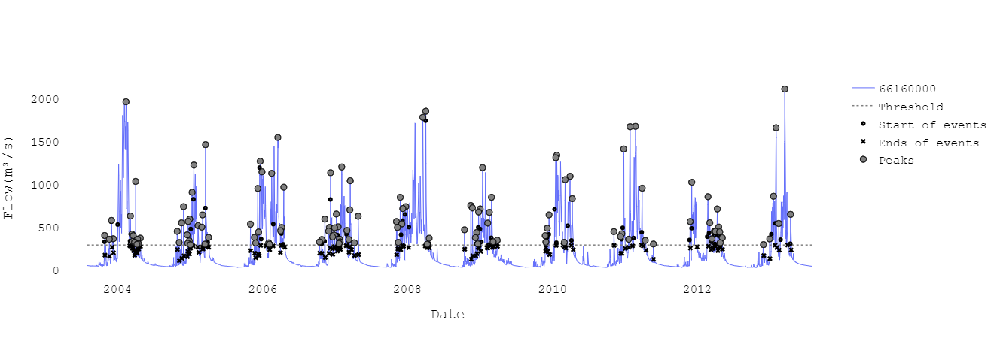

In [21]:
fig_events_high, data_events_high = iha_pre.events_high.plot_hydrogram("")
py.offline.iplot(fig_events_high)

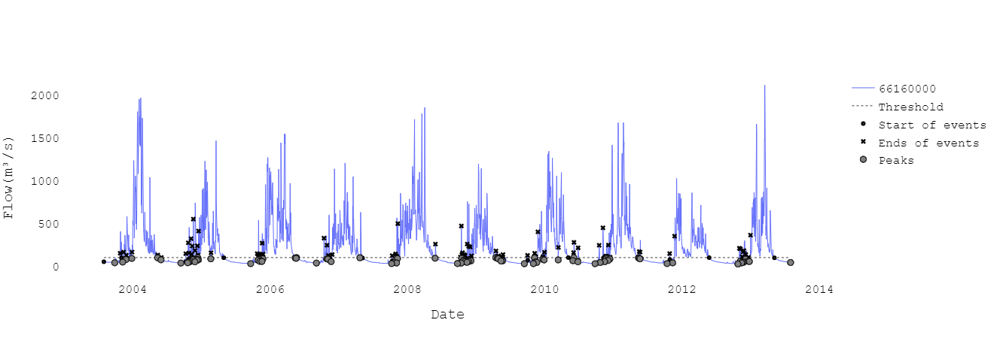

In [22]:
fig_events_low, data_events_low = iha_pre.events_low.plot_hydrogram("")
py.offline.iplot(fig_events_low)

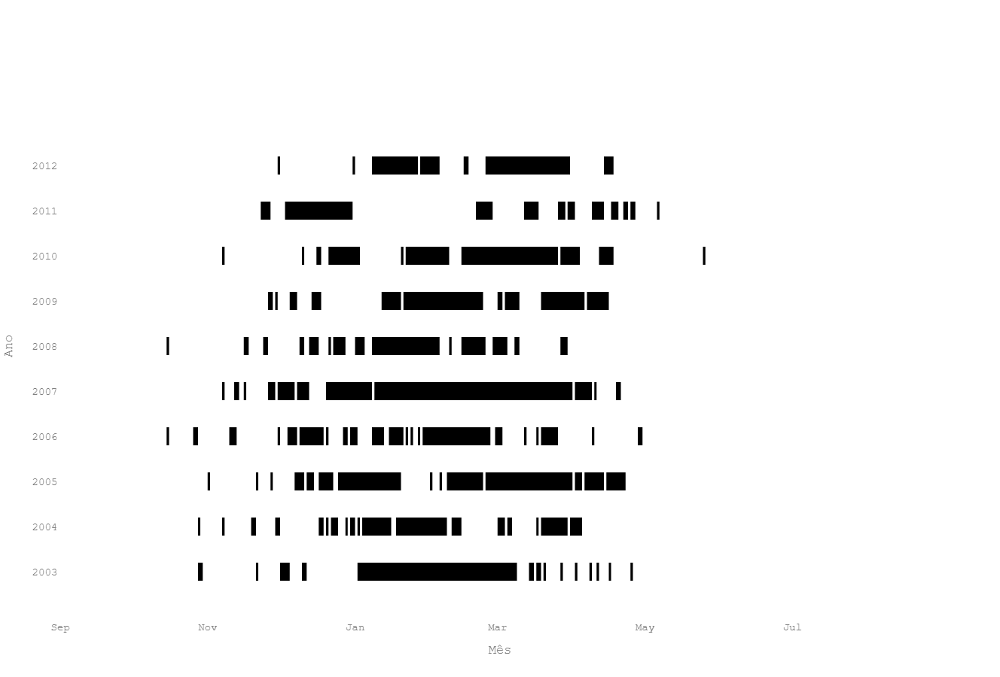

In [23]:
fig_events_spells_high, data_events_spells_high = iha_pre.events_high.plot_spells("")
py.offline.iplot(fig_events_spells_high)

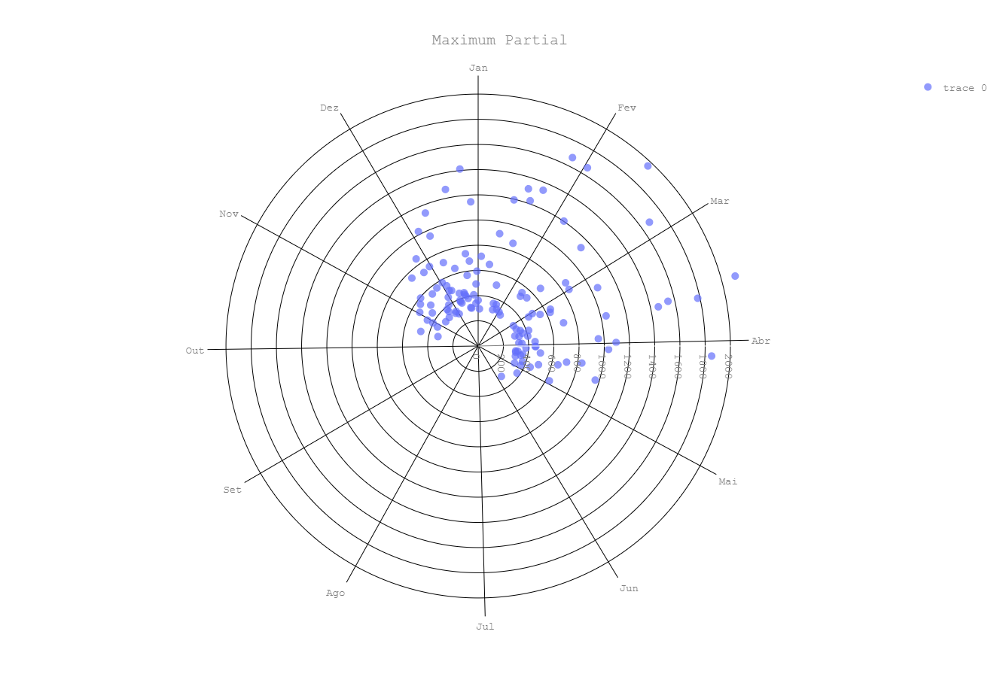

In [24]:
fig_events_polar_high, data_events_polar_high = iha_pre.events_high.plot_polar()
py.offline.iplot(fig_events_polar_high)

## Station 66231000

In [25]:
iha_pos = flow_raiz.iha(status='pos', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1,  
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [26]:
iha_pos.summary()

,Coeff. of Var.,Means
1-day maximum,144.456656,428.399096
1-day minimum,NaN,NaN
High events count,2.149630,1.026316
Low events count,0.000000,0.000000
High events duration,7.016470,11.797778
Low events duration,NaN,NaN
Date of maximum,35.752969,70.609206
Date of minimum,NaN,NaN


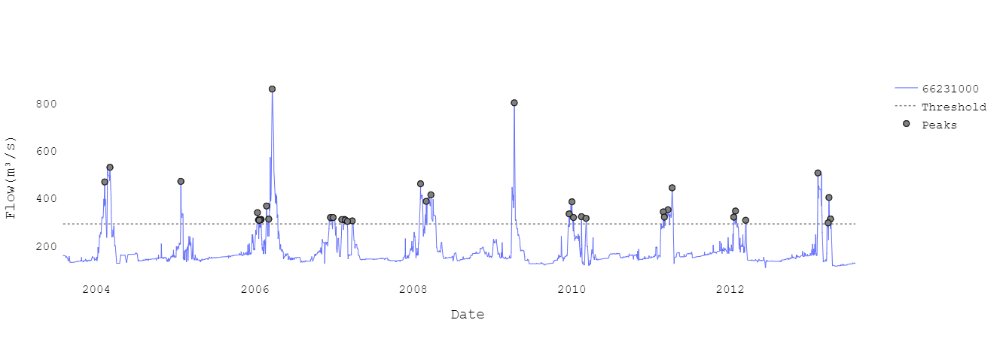

In [27]:
fig_events_high_pos, data_events_high_pos = iha_pos.events_high.plot_hydrogram("", point_start_end=False)
py.offline.iplot(fig_events_high_pos)

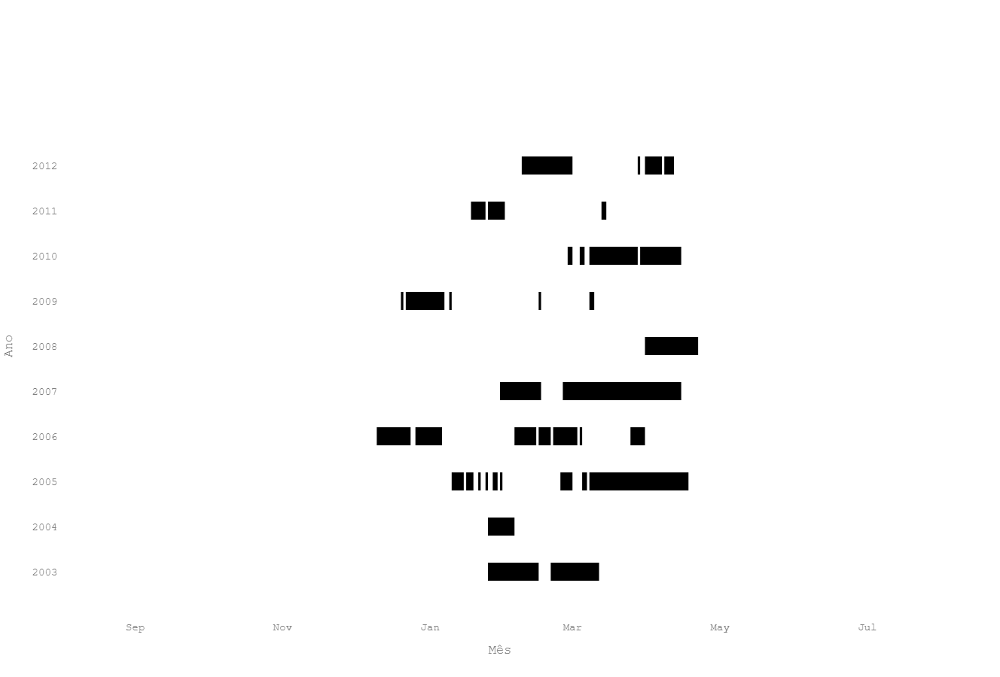

In [28]:
fig_events_spells_high_pos, data_events_spells_high_pos = iha_pos.events_high.plot_spells("")
py.offline.iplot(fig_events_spells_high_pos)

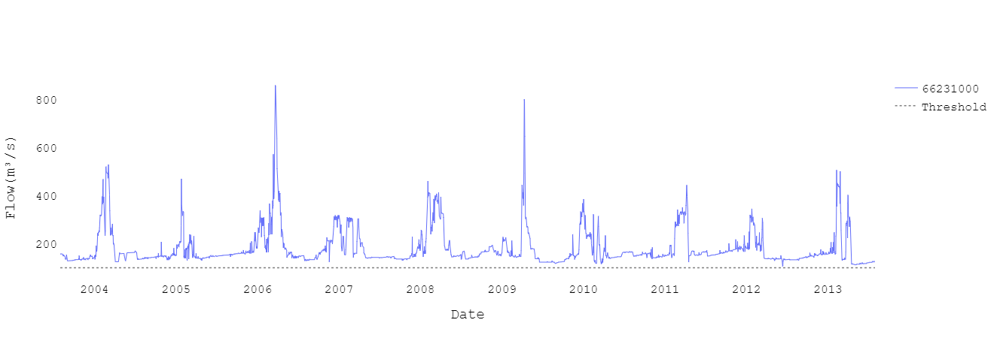

In [29]:
fig_events_low_pos, data_events_low_pos = iha_pos.events_low.plot_hydrogram("")
py.offline.iplot(fig_events_low_pos)

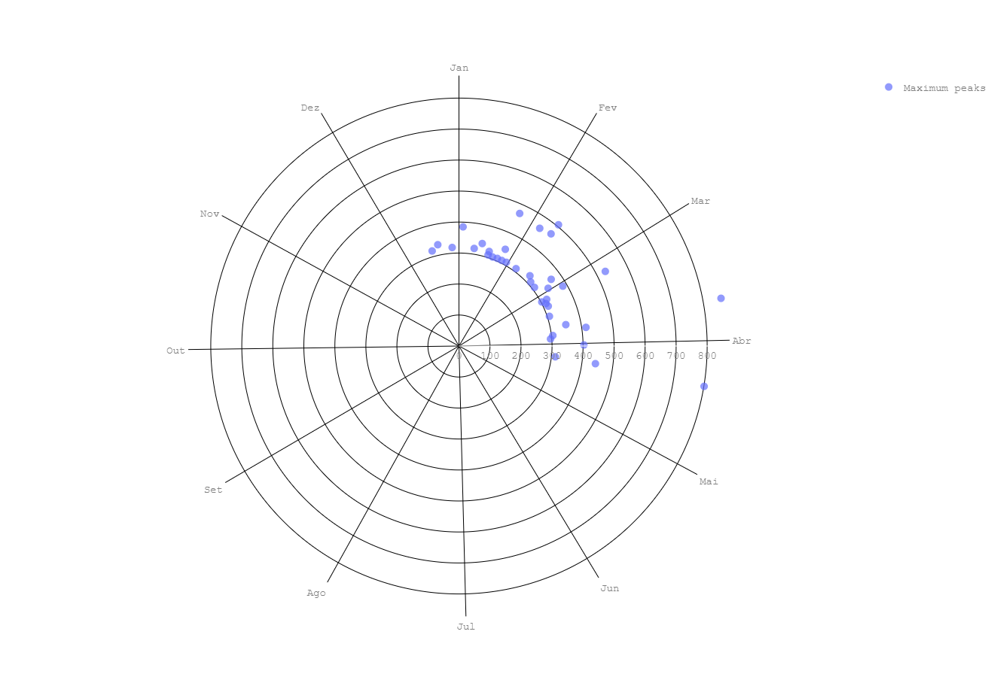

In [30]:
fig_events_polar_high_pos, data_events_polar_high_pos = iha_pos.events_high.plot_polar("")
py.offline.iplot(fig_events_polar_high_pos)

In [31]:
era = iha_pre.era(iha_obs=iha_pos)

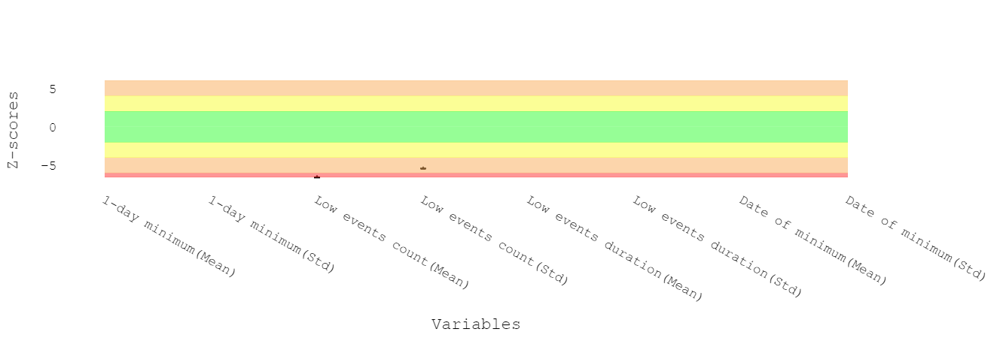

In [32]:
fig_low, data = era.plot(by_type_events="Low", showlegend=False, size_text=18)
py.offline.iplot(fig_low)

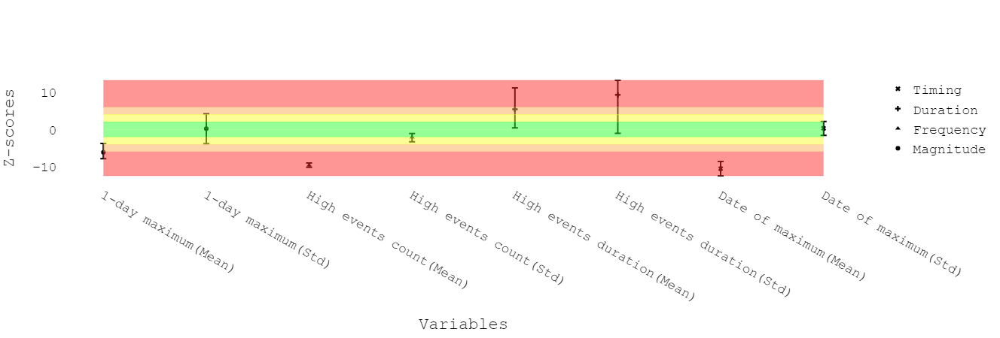

In [33]:
fig_high, data = era.plot(by_type_events="High", showlegend=True, size_text=18)
py.offline.iplot(fig_high)

In [34]:
# fig_low.write_image("Zscore_low_two.png", width=1200, height=800)
# fig_high.write_image("Zscore_high_two.png", width=1200, height=800)

In [35]:
era.values_mean()

1-day maximum           -6.175080
1-day minimum                 NaN
Date of maximum        -10.592606
Date of minimum               NaN
High events count       -9.678165
High events duration     5.431583
Low events count        -6.561803
Low events duration           NaN
Name: Pos - mean, dtype: float64

In [36]:
flow_quebo_copy = Flow(data=flow_quebo.data)
flow_quebo_copy.date(date_start="01/08/2007", date_end="31/07/2010")
flow_quebo_copy

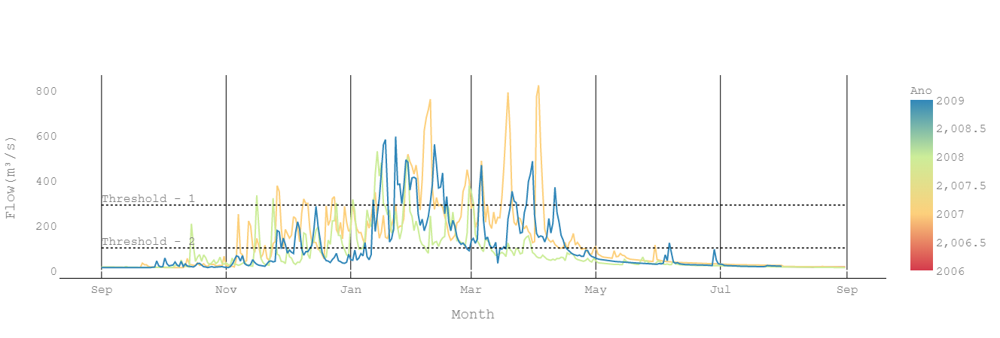

In [37]:
fig_hydro_year, data_hydro_year = flow_quebo_copy.hydrogram_year(title="", threshold=[threshold_high, threshold_low])
py.offline.iplot(fig_hydro_year)

In [38]:
fig = go.Figure(fig_hydro_year)
fig.write_image("hydro.png", width=1200, height=800)
# fig_high.write_image("Zscore_high_one.png", width=1200, height=800)